Credit risk analysis is a critical task for financial institutions, as it helps to minimize the risk associated with lending money. Accurately predicting whether a borrower is likely to default on loan payments is key to maintaining a healthy portfolio and minimizing losses. In this project, we aim to develop a machine learning model to predict the likelihood of default for borrowers using various data science techniques.

In [34]:
# Import necessary library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [35]:
data = pd.read_csv("Datasets/credit_risk_dataset.csv")
data.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [11]:
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


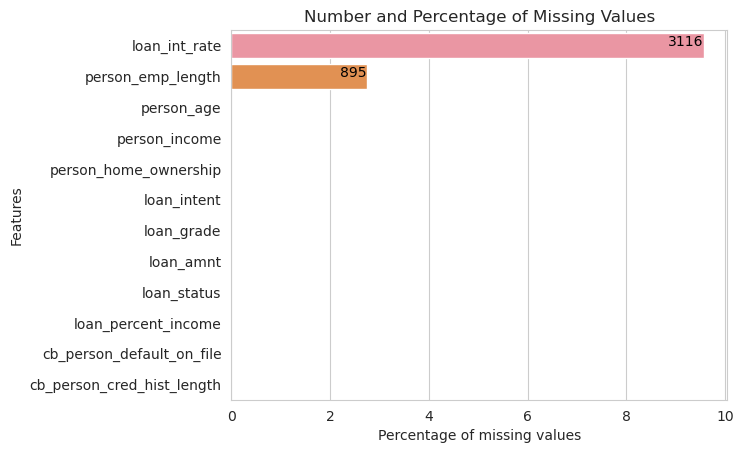

In [58]:
# Calculate number of missing values in each column
missing_values = data.isna().sum().sort_values(ascending=False)

# Calculate percentage of missing values in each column
percent_missing = (missing_values / len(data)) * 100

# Combine number and percentage of missing values into a dataframe
missing_data = pd.concat([missing_values, percent_missing], axis=1, keys=['Total', 'Percent'])

# Sort dataframe by percentage of missing values
missing_data = missing_data.sort_values('Percent', ascending=False)

# Plot missing data using seaborn
sns.set_style("whitegrid")
barplot = sns.barplot(x=missing_data['Percent'], y=missing_data.index)

plt.ylabel("Features")
plt.xlabel("Percentage of missing values")
plt.title("Number and Percentage of Missing Values")

for i, v in enumerate(missing_data['Total']):
    if missing_data['Percent'][i] > 0:
        barplot.text(missing_data['Percent'][i], i, str(v), color='black', ha='right', fontsize=10)


In [3]:
# Check the data types of each column
print(data.dtypes)

person_age                      int64
person_income                   int64
person_home_ownership          object
person_emp_length             float64
loan_intent                    object
loan_grade                     object
loan_amnt                       int64
loan_int_rate                 float64
loan_status                     int64
loan_percent_income           float64
cb_person_default_on_file      object
cb_person_cred_hist_length      int64
dtype: object


### Dataset
This dataset contains data for 32,581 borrowers and 12 features related to each of them.
- Age: numerical variables, age in years
- Annual Income: numerical variable; annual income in dollars
- Home Status: categorical variable; “rent”, “mortgage”, “own”
- Employment length: numerical variable; employment length in years
- Loan intent: categorical variable; “education”, “medical”, “venture”, “home improvement”, “personal”, or “debt consolidation”
- Loan amount: numerical variable; loan amount in dollars
- Loan grade: categorical variable; “A”, “B”, “C”, “D”, “E”, “F”, or “G”
- Interest rate: numerical variable; interest rate in percentage
- Loan to income ratio: numerical variable; between 0 and 1
- Historical default: binary categorical variable; “Y” or “N”
- Loan status: binary numerical variable; 0 (no defualt) or 1 (default). This is going to be our target variable.
- Credit History Lenght: numerical variable; credit lenght in years

### Data Exploration and Preprocessing

In [59]:
# Check for missing values in the dataset
data.isnull().sum().sort_values(ascending=False)

loan_int_rate                 3116
person_emp_length              895
person_age                       0
person_income                    0
person_home_ownership            0
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

We can see that `Employment length` and `Interest rate` both have missing values. Given that the missing values represent a small percentage of the dataset, we'll remove the rows that contain missing values.

In [60]:
# Drop missing values
data.dropna(axis=0, inplace=True)
data.isnull().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [5]:
# Check the summary statistics of the numerical variables
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28638.000000,2.863800e+04,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,6.664937e+04,4.788672,9656.493121,11.039867,0.216600,0.169488,5.793736
std,6.310441,6.235645e+04,4.154627,6329.683361,3.229372,0.411935,0.106393,4.038483
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.948000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.595600e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [7]:
data.select_dtypes(exclude='object').columns

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_cred_hist_length'],
      dtype='object')

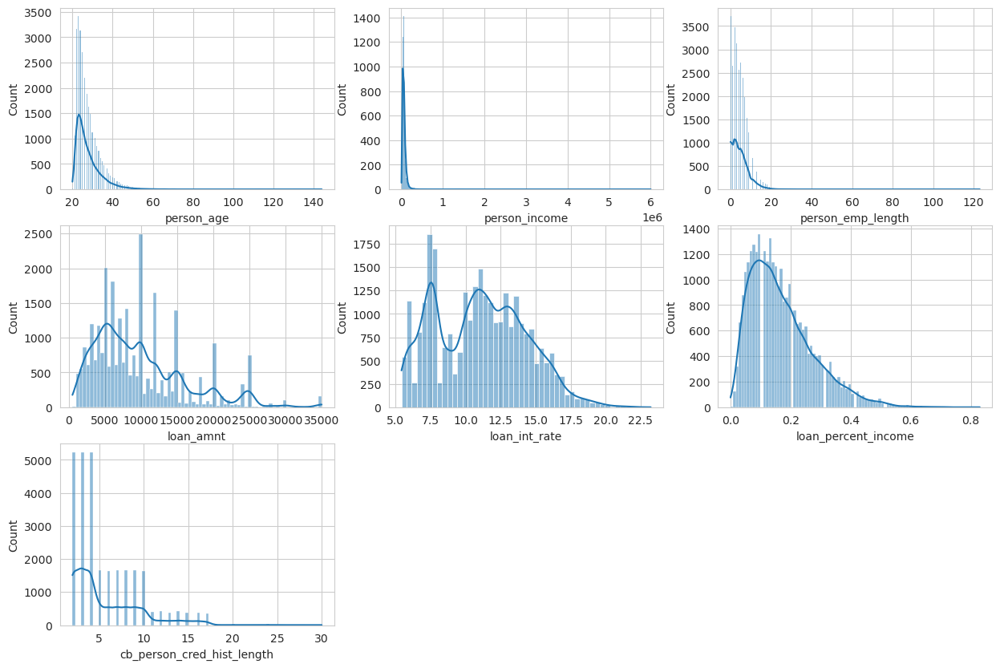

In [62]:
# Check the distribution of numerical varaibles
num_cols = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
            'loan_int_rate', 'loan_percent_income',
            'cb_person_cred_hist_length']
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10), squeeze=False)
for i, col in enumerate(num_cols):
    sns.histplot(ax=axes[i//3, i%3], data=data, x=col, kde=True)

for i in [1, 2]:
    fig.delaxes(axes[2][i])

In [63]:
data[num_cols].skew()

person_age                     2.564863
person_income                 35.190623
person_emp_length              2.752939
loan_amnt                      1.174480
loan_int_rate                  0.203978
loan_percent_income            1.077710
cb_person_cred_hist_length     1.663378
dtype: float64

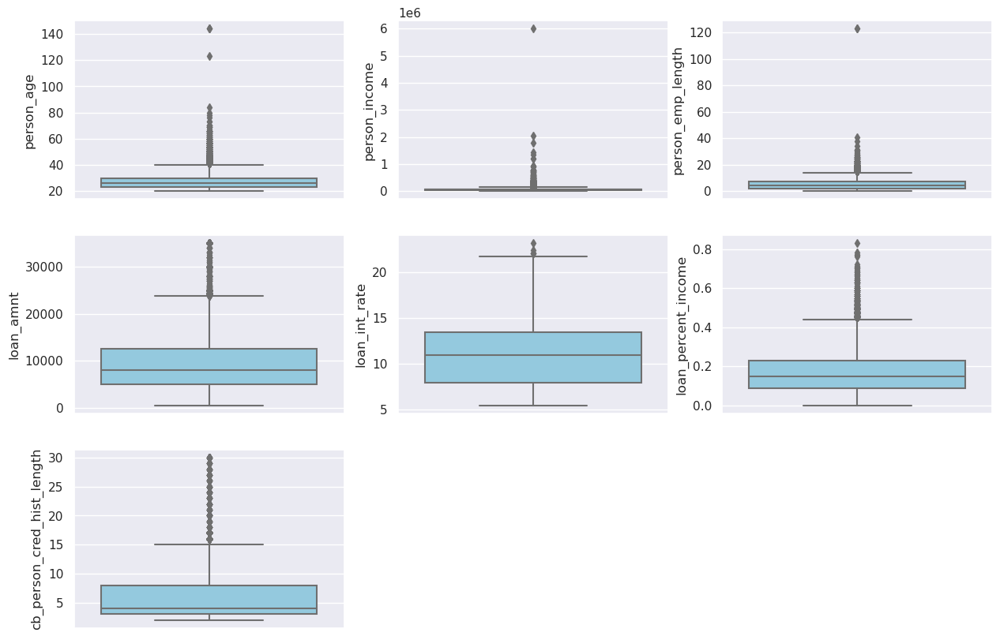

In [68]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
for i, col in enumerate(num_cols):
    sns.boxplot(ax=axes[i//3, i%3], data=data, y=col, color='skyblue')
    
for i in [1, 2]:
    fig.delaxes(axes[2][i])

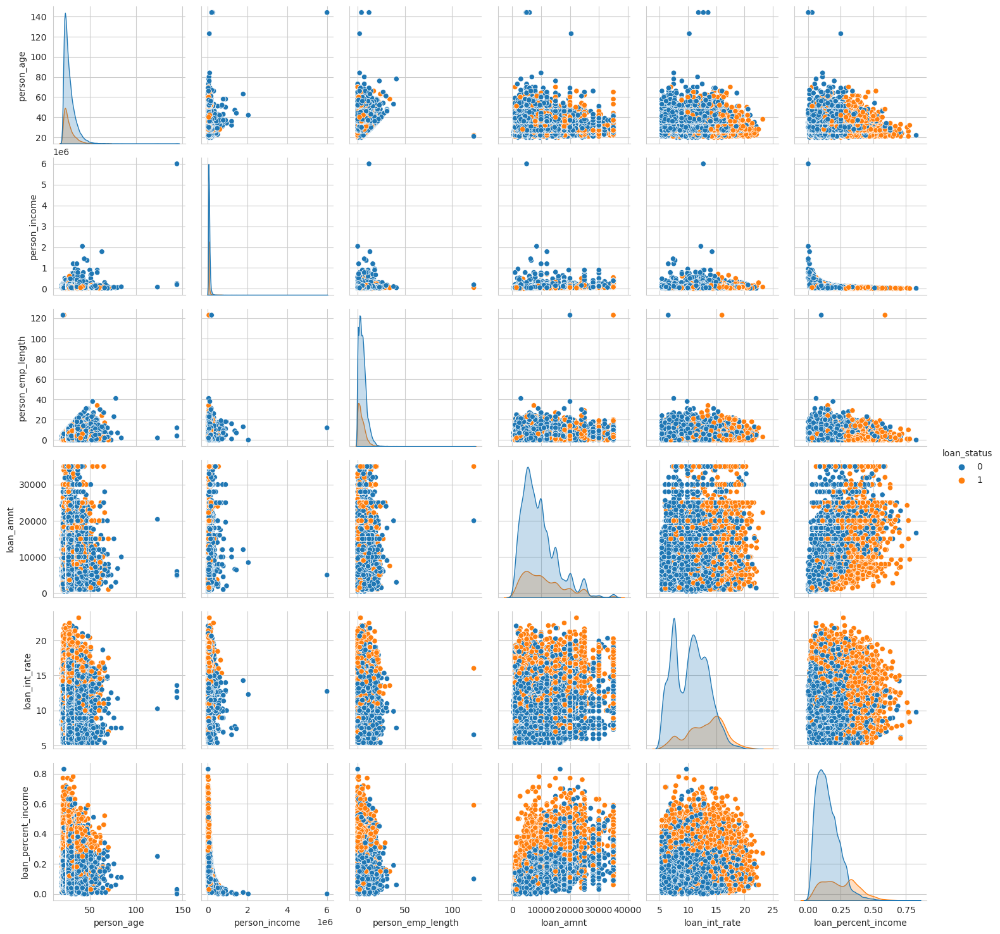

In [12]:
# Scatterplot matrix
sub_data = data[['person_age',"person_income","person_emp_length","loan_amnt","loan_int_rate", "loan_percent_income", 'loan_status']]
sns.pairplot(data=sub_data, hue='loan_status', )

There are not many people who have ___lived until the age of 144 or have been employed for 123 years___. These are likely outliers we are looking for, because they could negatively affect our model and thus should be removed. It's clear that ___Income also has an outlier___.

In [5]:
# Let's remove outliers from the dataset
# Age > 100, Employment lenght > 100, Income > 4,000,000 
drop_id = data[(data['person_age'] >= 100) | (data['person_emp_length'] >= 100) |
              (data['person_income'] >= 4000000)].index
drop_id

Int64Index([0, 81, 183, 210, 575, 32297], dtype='int64')

In [6]:
data.loc[drop_id]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
81,144,250000,RENT,4.0,VENTURE,C,4800,13.57,0,0.02,N,3
183,144,200000,MORTGAGE,4.0,EDUCATION,B,6000,11.86,0,0.03,N,2
210,21,192000,MORTGAGE,123.0,VENTURE,A,20000,6.54,0,0.10,N,4
575,123,80004,RENT,2.0,EDUCATION,B,20400,10.25,0,0.25,N,3
32297,144,6000000,MORTGAGE,12.0,PERSONAL,C,5000,12.73,0,0.00,N,25


In [7]:
data.drop(index=drop_id, axis=0, inplace=True)

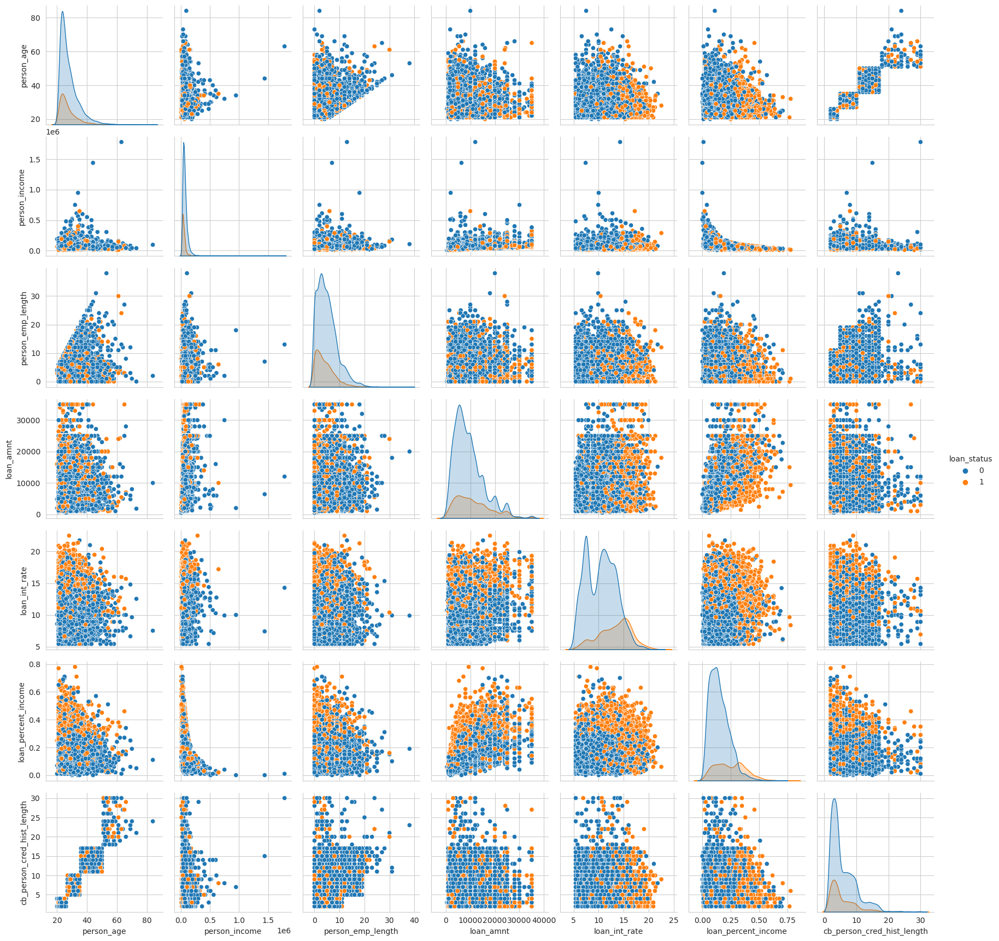

In [13]:
# Check scatter plot again
sub_data_cleaned = data[['person_age',"person_income","person_emp_length","loan_amnt","loan_int_rate", "loan_status", 'loan_percent_income', 'cb_person_cred_hist_length']]
sns.pairplot(data=sub_data_cleaned.sample(10000), hue='loan_status', )

It looks better now! We also find that borrowers, whose loan has ___high interest rate, tend to default___. Moreover, person who has ___high loan to income ratio has high chance of default___.

/tmp/ipykernel_8050/1439131390.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


<AxesSubplot: >

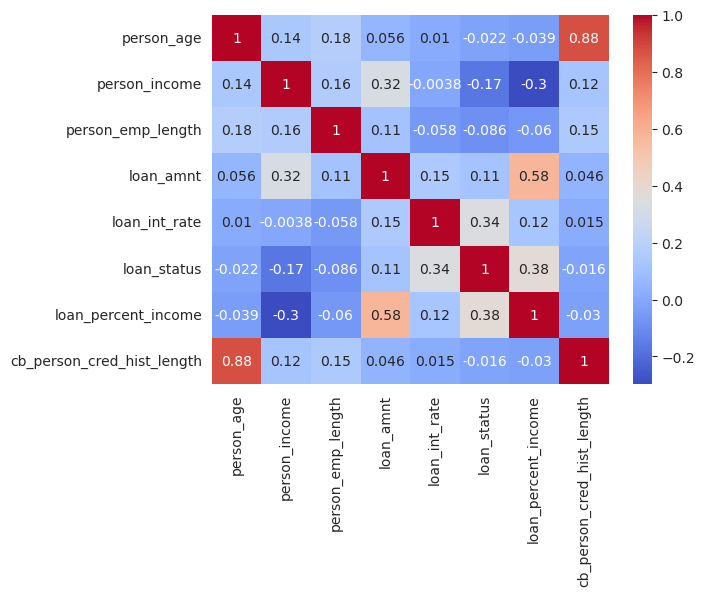

In [14]:
# Check the correlation between numerical variables
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

We also find that ___Person_age and Cb_person_cred_hist_length are highly correlated___. It seems like there is multicolinearity problem. However, we are not going to drop any column, just yet.

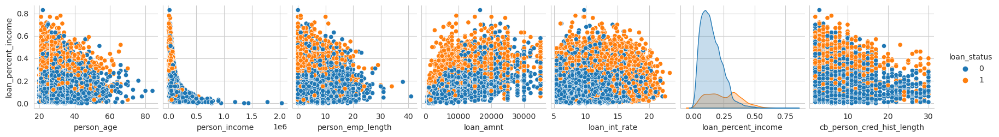

In [15]:
sns.pairplot(data=data, y_vars='loan_percent_income', hue='loan_status')

In [16]:
# Check target variable distribution
data.loan_status.value_counts()

0    22430
1     6202
Name: loan_status, dtype: int64

In this case, we are dealing with an ___imbalanced dataset___, meaning that we have considerably more non-default cases than default cases.

### Further explore how loan status is related to other variables

In [17]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

In [18]:
px.box(data, x='loan_grade', y='loan_percent_income', color='loan_status',
       color_discrete_sequence=px.colors.qualitative.Dark24)

When we look at this box plot, there are two things that quickly stand out. We can clearly see that those who don't default have a lower loan to income ratio __mean__ value across all loan grades. We can also see that no borrowers with ___loan grade G___ were able to repay their loan.

In [19]:
px.parallel_categories(data_frame=data, dimensions=['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file'], color='loan_status')

/home/kafka/.conda/envs/datascience/lib/python3.8/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



Using a ___parallel category diagram___, we can understand how different categorical variables in our dataset are related to each other and we can map out these relationships on the basis of loan status.

##### Main takeaways from the diagram:
- Our dataset is primarily composed of borrowers who have not defaulted on a loan before.
- Loan grades “A” and “B” are the most common grades while “F” and “G” are the least common;
- Home renters defaulted more often on their loans than those with a mortgage, whereas homeowners defaulted the least;
- Borrowers took out a loan for home improvement the least and for education the most. Also, defaults were more common for loans that were taken up for covering medical expenses and debt consolidation.

In [8]:
# Create a custom feature engineering class
from sklearn.base import BaseEstimator, TransformerMixin

class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_total_payment=True):
        self.add_total_payment = add_total_payment
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        int_rate_range = pd.Series(pd.cut(X['loan_int_rate'],
                                bins=[0, 14, 24], labels=['low', 'high']), name='int_rate_range')
        loan_to_income_range = pd.Series(pd.cut(X['loan_percent_income'],
                                     bins=[0, 0.2, 0.5, 1.], labels=['low', 'medium', 'high']), name='loan_to_income_range')

        if self.add_total_payment:
            total_payment = pd.Series(X['loan_amnt'] + X['loan_amnt'] * (X['loan_int_rate'] / 100), name='total_payment')
            return pd.concat([X, int_rate_range, loan_to_income_range,total_payment], axis=1)
        return pd.concat([X, int_rate_range, loan_to_income_range], axis=1)

In [9]:
attrib_adder = CombinedAttributesAdder()
attrib_adder.fit(data)
data = attrib_adder.transform(data)
data.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,int_rate_range,loan_to_income_range,total_payment
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2,low,low,1111.40
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3,low,high,6207.85
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2,high,high,40330.50
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4,high,high,39994.50
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2,low,medium,2678.50


In [10]:
# transform features
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer

num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('scaler', MinMaxScaler())
])

data['loan_status'] = pd.Categorical(data['loan_status'])
X = data.drop('loan_status', axis=1)
y = data['loan_status']

num_attribs = list(X.select_dtypes(exclude=['object', 'category']).columns)

nominal_cat = list(['person_home_ownership', 'loan_intent', 'cb_person_default_on_file', 'int_rate_range', 'loan_to_income_range'])

ordinal_cat = ['loan_grade']

trans_pipeline = ColumnTransformer(
    [
        ('ordinal', OrdinalEncoder(categories=[['A', 'B', 'C', 'D', 'E', 'F', 'G']]), ordinal_cat),
        ('nominal', OneHotEncoder(), nominal_cat),
        ('numeric', num_pipeline, num_attribs)
    ], verbose_feature_names_out=False
)

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, stratify=y, test_size=.2)

In [12]:
# Create a function to assess the model's ability to predict class labels
from sklearn.metrics import classification_report
def model_assess(model, name):
    print('         ', name, '\n', classification_report(y_test, model.predict(X_test)))

In [13]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

knn = KNeighborsClassifier(n_neighbors=20)

logreg = LogisticRegression(max_iter=500)

svc = SVC(probability=True)

tree = DecisionTreeClassifier(max_depth=10) # To avoid overfitting

xgb = XGBClassifier()

list_model = [knn, logreg, svc, tree, xgb]
model_names = ['KNeighborsClassifier', 'LogisticRegression', 'SVC', 'DecisionTreeClassifier', 'XGBClassifier']
diff_model = {}
def model_training():
    for i, j in enumerate(list_model):
        model_pipeline = Pipeline([
            ('preprocessing', trans_pipeline),
            ('model', j)
        ])
        model_pipeline.fit(X_train, y_train)
        model_assess(model_pipeline, model_names[i])
        diff_model[model_names[i]] = model_pipeline
    return diff_model

In [14]:
trained_models = model_training()

          KNeighborsClassifier 
               precision    recall  f1-score   support

           0       0.89      0.97      0.93      4486
           1       0.84      0.58      0.69      1241

    accuracy                           0.89      5727
   macro avg       0.87      0.77      0.81      5727
weighted avg       0.88      0.89      0.88      5727

          LogisticRegression 
               precision    recall  f1-score   support

           0       0.88      0.96      0.91      4486
           1       0.76      0.52      0.62      1241

    accuracy                           0.86      5727
   macro avg       0.82      0.74      0.77      5727
weighted avg       0.85      0.86      0.85      5727

          SVC 
               precision    recall  f1-score   support

           0       0.90      0.98      0.94      4486
           1       0.91      0.61      0.73      1241

    accuracy                           0.90      5727
   macro avg       0.90      0.80      0.83     

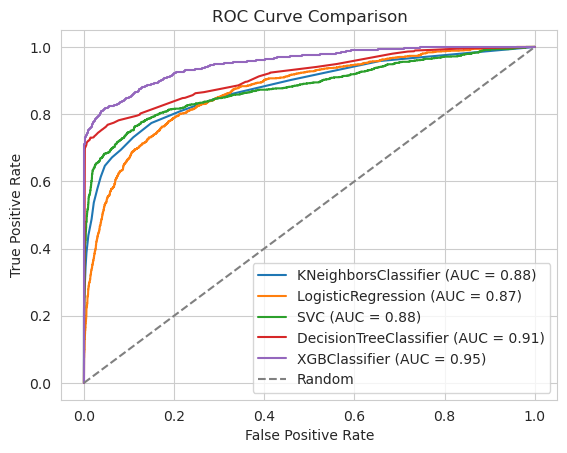

In [15]:
from sklearn.metrics import auc, roc_curve
def plot_roc_curve(y_true, y_probs_dict):
    fig, ax = plt.subplots()
    for name, y_probs in y_probs_dict.items():
        fpr, tpr, thresholds = roc_curve(y_true, y_probs)
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

    # Plot the ROC curve and add labels, title, and legend
    ax.plot([0, 1], [0, 1], linestyle='--', color='grey', label='Random')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC Curve Comparison')
    ax.legend(loc='lower right')
    plt.show()

y_probs_dict = {}
for i in model_names:
    y_probs_dict[i] = trained_models[i].predict_proba(X_test)[:, 1]

plot_roc_curve(y_test, y_probs_dict)

In [17]:
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.tree import DecisionTreeClassifier
tree2 = DecisionTreeClassifier(max_depth=10, class_weight={0:1, 1:3.5})
tree_pipeline = Pipeline([
    ('preprocessing', trans_pipeline),
    ('model', tree2)
])
tree_pipeline.fit(X_train, y_train)
model_assess(tree_pipeline, 'Tree')

          Tree 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      4486
           1       0.89      0.74      0.81      1241

    accuracy                           0.92      5727
   macro avg       0.91      0.86      0.88      5727
weighted avg       0.92      0.92      0.92      5727



In [21]:
def evaluate_model(model, validation_set):
    y_train_probs = model.predict_proba(X_train)[:, 1]
    print('AUC score of training data: ', roc_auc_score(y_train, y_train_probs))
    if validation_set:
        y_val_probs = model.predict_proba(X_val)[:, 1]
        y_val_preds = model.predict(X_val)
        print('AUC score of validation set: ', roc_auc_score(y_val, y_val_probs))
    y_test_probs = model.predict_proba(X_test)[:, 1]
    print('AUC score of test data', roc_auc_score(y_test, y_test_probs))

    y_train_preds = model.predict(X_train)
    y_test_preds = model.predict(X_test)
    print('F1 score of training data: ', f1_score(y_train, y_train_preds))
    if validation_set:
        print('F1 score of validation set: ', f1_score(y_val, y_val_preds))
    print('F1 score of test data: ', f1_score(y_test, y_test_preds))

AUC score of training data:  0.9380741226057228
AUC score of test data 0.9099238996925882
F1 score of training data:  0.8332068928145661
F1 score of test data:  0.8092941692240245


Text(0.5, 1.0, 'Feature Importances')

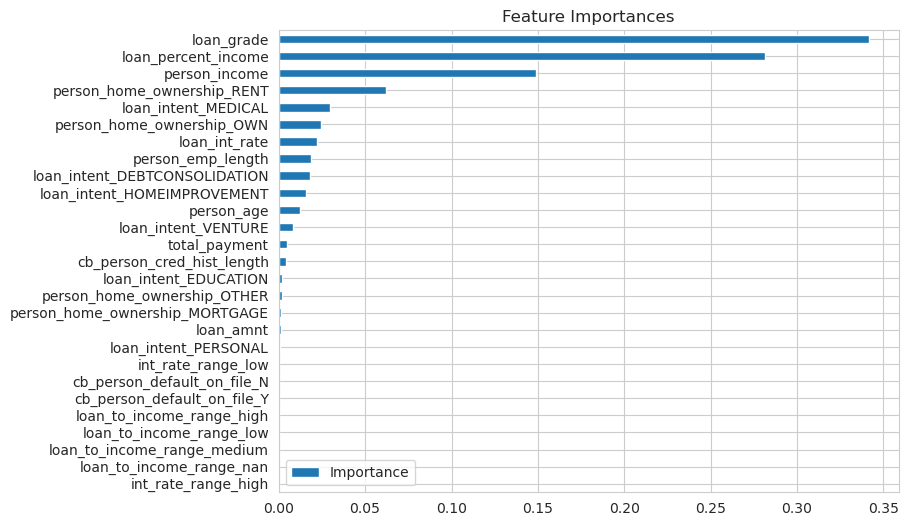

In [19]:
evaluate_model(tree_pipeline, False)
feat_importances = pd.DataFrame(tree_pipeline['model'].feature_importances_, index=tree_pipeline['preprocessing'].get_feature_names_out(), columns=["Importance"])
feat_importances.sort_values(by='Importance', ascending=True, inplace=True)
feat_importances.plot.barh(figsize=(8,6))
plt.title('Feature Importances')

In [57]:
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(model):
    y_pred = model.predict(X_test)
    cf_matrix = confusion_matrix(y_test, y_pred)
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in cf_matrix.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

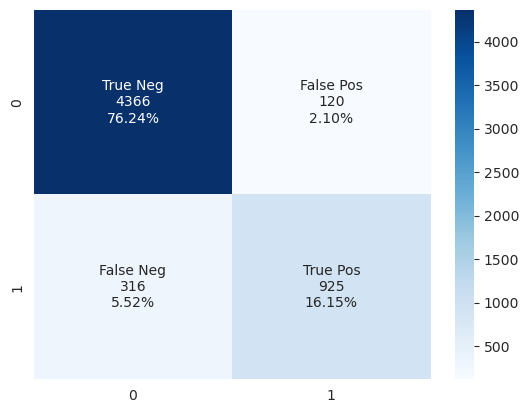

In [58]:
plot_confusion_matrix(tree_pipeline)

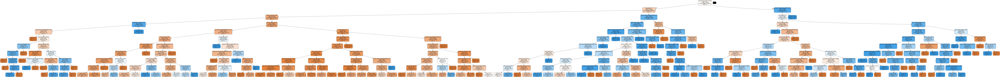

In [59]:
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
from IPython.display import Image

dot_data = export_graphviz(tree_pipeline['model'], out_file=None, feature_names=tree_pipeline['preprocessing'].get_feature_names_out(), class_names=['0', '1'], filled=True, rounded=True, special_characters=True)

# Create a graph from the dot_data string
graph = pydotplus.graph_from_dot_data(dot_data)

# Show the graph in Jupyter notebook
Image(graph.create_png())

# Alternatively, you can save the graph to a file
# graph.write_png("decision_tree.png")

In [13]:
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, random_state=0, stratify=y_train, test_size=.2)

In [14]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.model_selection import StratifiedKFold

kfolds = StratifiedKFold(5)

xgb = XGBClassifier(scale_pos_weight=3.5)
param_gird = {
    'model__max_depth': [3, 5, 7],
    'model__n_estimators': [50, 100, 200],
    'model__learning_rate': [0.01, 0.1, 1.]
}

model_pipeline = Pipeline([
    ('preprocessing', trans_pipeline),
    ('model', xgb)
])

# score = cross_val_score(model_pipeline, X_train, y_train, cv=5, scoring='f1')
# score
grid = GridSearchCV(model_pipeline, param_grid=param_gird, scoring='f1', verbose=1, cv=kfolds)
grid.fit(X_train_split, y_train_split)
print("Best cross-validation score: {:.2f}".format(grid.best_score_))
print("Validation set score: {:.2f}".format(grid.score(X_val, y_val)))
print("Test set score: {:.2f}".format(grid.score(X_test, y_test)))
print("Best parameters: {}".format(grid.best_params_))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best cross-validation score: 0.82
Validation set score: 0.82
Test set score: 0.83
Best parameters: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 200}


In [22]:
evaluate_model(grid, True)

AUC score of training data:  0.9881882967125748
AUC score of validation set:  0.9462456408020923
AUC score of test data 0.9482871413364814
F1 score of training data:  0.9281272300948108
F1 score of validation set:  0.822233875196644
F1 score of test data:  0.825734980826587


It seems like the XGBoost model overfit the training data.
Let's regularize it a bit!

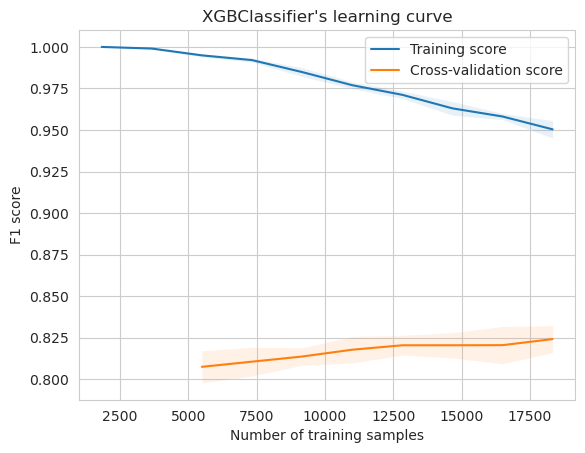

In [24]:
# Plot learning curve to check if the model is overfitting the training data
from sklearn.model_selection import learning_curve
xgb2 = XGBClassifier(learning_rate=0.1, max_depth=7, n_estimators=200, scale_pos_weight=3.5)
xgb_pipeline = Pipeline([
    ('preprocessing', trans_pipeline),
    ('model', xgb2)
])

# Define range of training set sizes
train_sizes, train_scores, valid_scores = learning_curve(
    xgb_pipeline, X_train, y_train, cv=kfolds, scoring='f1',
    n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate mean and standard deviation of training and validation scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
valid_mean = np.mean(valid_scores, axis=1)
valid_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.plot(train_sizes, train_mean, label='Training score')
plt.fill_between(train_sizes, train_mean - train_std,
                 train_mean + train_std, alpha=0.1)
plt.plot(train_sizes, valid_mean, label='Cross-validation score')
plt.fill_between(train_sizes, valid_mean - valid_std,
                 valid_mean + valid_std, alpha=0.1)

# Add labels and title
plt.xlabel('Number of training samples')
plt.ylabel('F1 score')
plt.title('XGBClassifier\'s learning curve')
plt.legend(loc='best')

/home/kafka/.conda/envs/datascience/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/kafka/.conda/envs/datascience/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/home/kafka/.conda/envs/datascience/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 220, in __call__
    return self._score(
  File "/home/kafka/.conda/envs/datascience/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 262, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/home/kafka/.conda/envs/datascience/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 72, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/home/kafka/.conda/envs/datascience/lib/python3.8

Training set score:  [0.84674581 0.88372258 0.88958466 0.88626639 0.88209565 0.87552914
 0.87594702 0.86960836 0.86604688 0.86416335]
Validation set score:  [       nan        nan 0.78685666 0.79293664 0.80018019 0.80077355
 0.80467162 0.80208566 0.80551991 0.80571369]


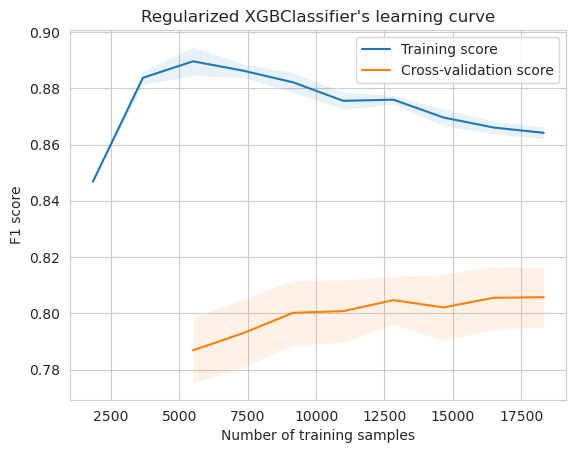

In [33]:
# Plot Regularized-XGBClassifier's learning curve
xgb2 = XGBClassifier(learning_rate=0.1, max_depth=6, n_estimators=150, scale_pos_weight=3.5, reg_alpha=10)
xgb_pipeline = Pipeline([
    ('preprocessing', trans_pipeline),
    ('model', xgb2)
])
kfolds = StratifiedKFold(5)


# Define range of training set sizes
train_sizes, train_scores, valid_scores = learning_curve(
    xgb_pipeline, X_train, y_train, cv=kfolds, scoring='f1',
    n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate mean and standard deviation of training and validation scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
valid_mean = np.mean(valid_scores, axis=1)
valid_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.plot(train_sizes, train_mean, label='Training score')
plt.fill_between(train_sizes, train_mean - train_std,
                 train_mean + train_std, alpha=0.1)
plt.plot(train_sizes, valid_mean, label='Cross-validation score')
plt.fill_between(train_sizes, valid_mean - valid_std,
                 valid_mean + valid_std, alpha=0.1)

# Add labels and title
plt.xlabel('Number of training samples')
plt.ylabel('F1 score')
plt.title('Regularized XGBClassifier\'s learning curve')
plt.legend(loc='best')

print('Training set score: ', train_mean)
print('Validation set score: ', valid_mean)

In [38]:
from sklearn.metrics import f1_score
xgb2 = XGBClassifier(learning_rate=0.1, max_depth=6, n_estimators=150, scale_pos_weight=3.5, reg_alpha=10)

xgb_pipeline = Pipeline([
    ('preprocessing', trans_pipeline),
    ('model', xgb2)
])
xgb_pipeline.fit(X_train, y_train)
y_train_pred = xgb_pipeline.predict(X_train)
print(f1_score(y_train, y_train_pred))

# y_val_pred = model_pipeline2.predict(X_val)
# print(f1_score(y_val, y_val_pred))

y_test_pred = xgb_pipeline.predict(X_test)
print(f1_score(y_test, y_test_pred))

0.8539737458023812
0.8187422934648583


In [69]:
model_assess(grid, 'Unregularized XGB')

          Unregularized XGB 
               precision    recall  f1-score   support

           0       0.94      0.97      0.96      4486
           1       0.88      0.78      0.83      1241

    accuracy                           0.93      5727
   macro avg       0.91      0.88      0.89      5727
weighted avg       0.93      0.93      0.93      5727



In [40]:
model_assess(xgb_pipeline, 'XGB')

          XGB 
               precision    recall  f1-score   support

           0       0.95      0.96      0.95      4486
           1       0.84      0.80      0.82      1241

    accuracy                           0.92      5727
   macro avg       0.89      0.88      0.88      5727
weighted avg       0.92      0.92      0.92      5727



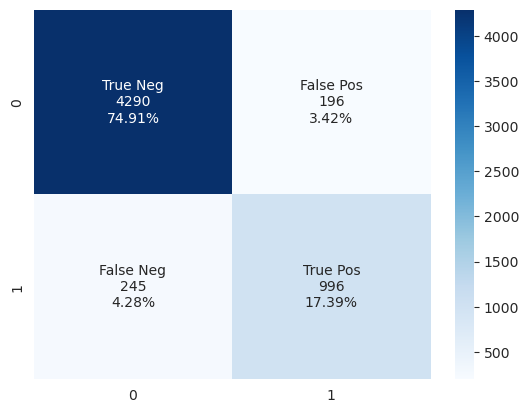

In [39]:
plot_confusion_matrix(xgb_pipeline)

In [45]:
# Adjust the probability threshold
def adjust_probability_threshold(model, threshold):
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    y_pred = np.where(y_pred_proba > 0.5, 1, 0)  # Use a probability threshold of 0.5

    # Print the confusion matrix and classification report
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    # Adjust the probability threshold to 0.21
    y_pred = np.where(y_pred_proba > threshold, 1, 0)

    # Print the confusion matrix and classification report
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

In [71]:
# Calculate precision and recall for different probability thresholds
from sklearn.metrics import precision_recall_curve
def pre_rec_threshold(model, name):
    y_pred_probs = model.predict_proba(X_test)[:, 1]
    precision, recall, threshold = precision_recall_curve(y_test, y_pred_probs)

    # Plot precision and recall versus threshold
    plt.plot(threshold, precision[:-1], 'b--', label='Precision')
    plt.plot(threshold, recall[:-1], 'g-', label='Recall')
    plt.xlabel('Threshold')
    plt.legend()
    plt.title(f'Precision and Recall versus Threshold ({name})')

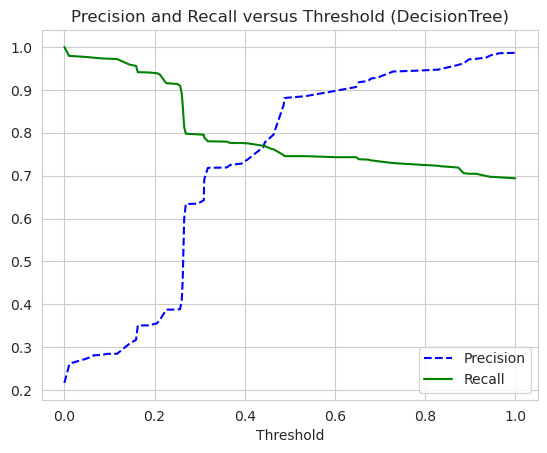

In [72]:
pre_rec_threshold(tree_pipeline, 'DecisionTree')

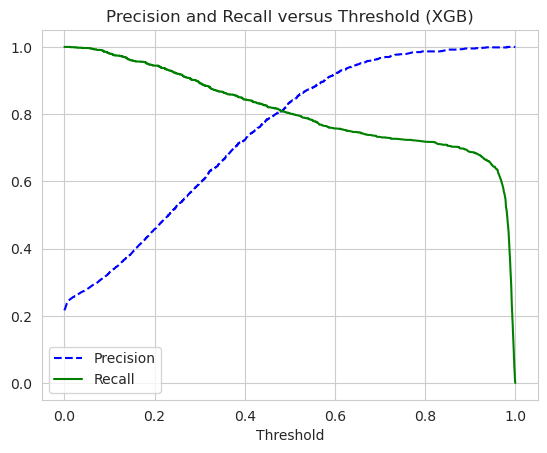

In [73]:
pre_rec_threshold(xgb_pipeline, 'XGB')

In [68]:
adjust_probability_threshold(tree_pipeline, 0.48)

[[4366  120]
 [ 316  925]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      4486
           1       0.89      0.75      0.81      1241

    accuracy                           0.92      5727
   macro avg       0.91      0.86      0.88      5727
weighted avg       0.92      0.92      0.92      5727

[[4340  146]
 [ 313  928]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      4486
           1       0.86      0.75      0.80      1241

    accuracy                           0.92      5727
   macro avg       0.90      0.86      0.88      5727
weighted avg       0.92      0.92      0.92      5727



In [67]:
adjust_probability_threshold(xgb_pipeline, 0.49)

[[4290  196]
 [ 245  996]]
              precision    recall  f1-score   support

           0       0.95      0.96      0.95      4486
           1       0.84      0.80      0.82      1241

    accuracy                           0.92      5727
   macro avg       0.89      0.88      0.88      5727
weighted avg       0.92      0.92      0.92      5727

[[4266  220]
 [ 241 1000]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      4486
           1       0.82      0.81      0.81      1241

    accuracy                           0.92      5727
   macro avg       0.88      0.88      0.88      5727
weighted avg       0.92      0.92      0.92      5727



Text(0.5, 0, 'Gain')

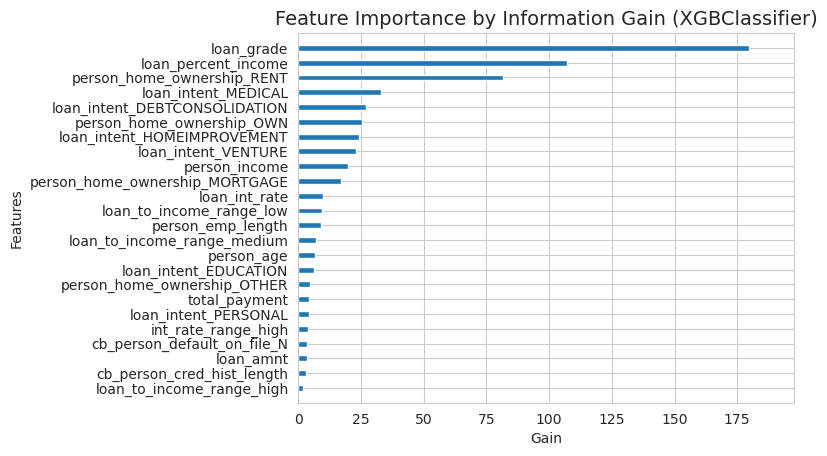

In [75]:
# Feature importance plot
from xgboost import plot_importance
xgb_pipeline['model'].get_booster().feature_names = list(xgb_pipeline['preprocessing'].get_feature_names_out())

plot_importance(xgb_pipeline['model'], importance_type='gain', show_values=False, height=0.4)
plt.title('Feature Importance by Information Gain (XGBClassifier)', fontsize = 14)
plt.xlabel('Gain')

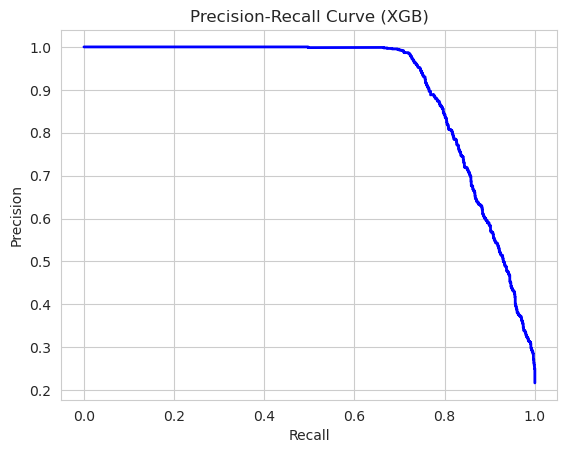

In [86]:
# Calculate precision and recall for different probability thresholds
y_pred_probs = xgb_pipeline.predict_proba(X_test)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_probs)

# Plot the precision-recall curve
plt.plot(recall, precision, 'b-', linewidth=2)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (XGB)')
plt.show()

Recall at 0.80 precision: 0.82
Threshold probability results in 0.8 precision: 0.47


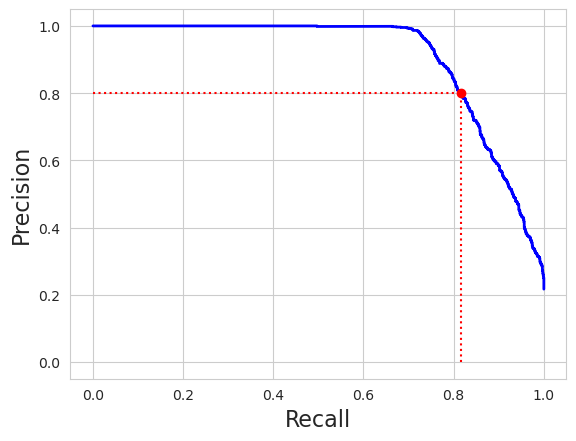

In [85]:
# Recall at 0.72 precision
recall_80_precision = recall[np.argmax(precision >= 0.80)]
threshold_80_precision = thresholds[np.argmax(precision >= 0.80)]

def plot_precision_vs_recall(precisions, recalls):
    plt.plot(recalls, precisions, "b-", linewidth=2)
    plt.xlabel("Recall", fontsize=16)
    plt.ylabel("Precision", fontsize=16)

plot_precision_vs_recall(precision, recall)
plt.plot([recall_80_precision, recall_80_precision], [0., 0.8], "r:")
plt.plot([0.0, recall_80_precision], [0.8, 0.8], "r:")
plt.plot([recall_80_precision], [0.8], "ro")

print(f'Recall at 0.80 precision: {recall_80_precision:.2f}')
print(f'Threshold probability results in 0.8 precision: {threshold_80_precision:.2f}')

In [14]:
y_train.value_counts()

0    17905
1     5000
Name: loan_status, dtype: int64

In [40]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
xgb2 = XGBClassifier(learning_rate=0.1, max_depth=6, n_estimators=100, scale_pos_weight=3.5)

model_pipeline2 = Pipeline([
    ('preprocessing', trans_pipeline),
    ('model', xgb2)
])
model_pipeline2.fit(X_train, y_train)
evaluate_model(model_pipeline2, 1)
# y_train_pred = model_pipeline2.predict(X_train)
# print(roc_auc_score(y_train, y_train_pred))
#
# y_test_pred = model_pipeline2.predict(X_test)
# print(roc_auc_score(y_test, y_test_pred))

AUC score of training data:  0.976815864573573
AUC score of test data 0.9462255749196264
F1 score of training data:  0.8731216516398798
F1 score of test data:  0.823132123258759


AUC score of validation set:  0.9420851627733486
F1 score of validation set:  0.8144654088050316


In [28]:
from sklearn.metrics import f1_score
preds = grid.predict(X_test)
roc_auc_score(y_true=y_test, y_score=preds)

0.8761689081733022

In [29]:
from sklearn.metrics import classification_report
def model_assess(model, name='Default'):
    preds = model.predict(X_test)
    preds_proba = model.predict_proba(X_test)
    print('         ', name, '\n', classification_report(y_test, model.predict(X_test)))

In [30]:
model_assess(grid, name='XGBRFClassifier')

          XGBRFClassifier 
               precision    recall  f1-score   support

           0       0.95      0.95      0.95      4525
           1       0.80      0.80      0.80      1202

    accuracy                           0.92      5727
   macro avg       0.88      0.88      0.88      5727
weighted avg       0.92      0.92      0.92      5727



In [41]:
model_assess(model_pipeline2, name='XGBClassifier')

          XGBClassifier 
               precision    recall  f1-score   support

           0       0.95      0.95      0.95      4525
           1       0.82      0.80      0.81      1202

    accuracy                           0.92      5727
   macro avg       0.88      0.88      0.88      5727
weighted avg       0.92      0.92      0.92      5727



In [20]:
y_pred = grid.predict(X_test)

In [43]:
preds = model_pipeline2.predict(X_test)
from sklearn.metrics import confusion_matrix, precision_score, recall_score
confusion_matrix(y_test, preds)

array([[4316,  209],
       [ 243,  959]])

In [22]:
precision_score(y_test, y_pred)

0.8038237738985868

In [23]:
recall_score(y_test, y_pred)

0.8044925124792013

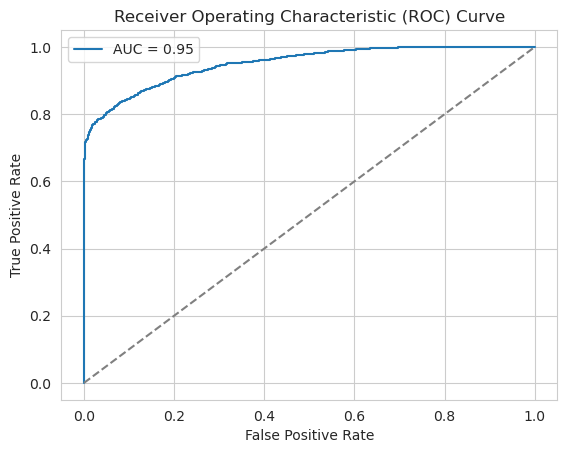

In [24]:
# Plot a ROC curve
from sklearn.metrics import roc_curve, roc_auc_score

# Make predictions on the test set
y_pred_proba = grid.predict_proba(X_test)[:, 1]

# Calculate the AUC score
auc_score = roc_auc_score(y_test, y_pred_proba)

# Calculate the false positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

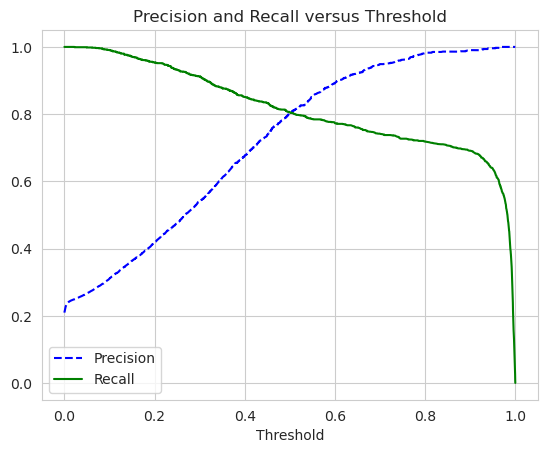

In [25]:
# Calculate precision and recall for different probability thresholds
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

# Plot precision and recall versus threshold
plt.plot(thresholds, precision[:-1], 'b--', label='Precision')
plt.plot(thresholds, recall[:-1], 'g-', label='Recall')
plt.xlabel('Threshold')
plt.legend()
plt.title('Precision and Recall versus Threshold')
plt.show()

In [30]:
# Adjust the probability threshold

y_pred = np.where(y_pred_proba > 0.5, 1, 0)  # Use a probability threshold of 0.5

# Print the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# Adjust the probability threshold to 0.21
y_pred = np.where(y_pred_proba > 0.46, 1, 0)

# Print the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[4289  236]
 [ 235  967]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      4525
           1       0.80      0.80      0.80      1202

    accuracy                           0.92      5727
   macro avg       0.88      0.88      0.88      5727
weighted avg       0.92      0.92      0.92      5727

[[4208  317]
 [ 212  990]]
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      4525
           1       0.76      0.82      0.79      1202

    accuracy                           0.91      5727
   macro avg       0.85      0.88      0.87      5727
weighted avg       0.91      0.91      0.91      5727



In [82]:
grid.predict_proba(X_test)[:10]

array([[0.11920303, 0.88079697],
       [0.12052017, 0.8794798 ],
       [0.86307836, 0.13692161],
       [0.82113993, 0.1788601 ],
       [0.85553205, 0.14446793],
       [0.85061055, 0.14938946],
       [0.8517301 , 0.14826992],
       [0.84954655, 0.15045346],
       [0.84594667, 0.15405335],
       [0.77359945, 0.22640055]], dtype=float32)

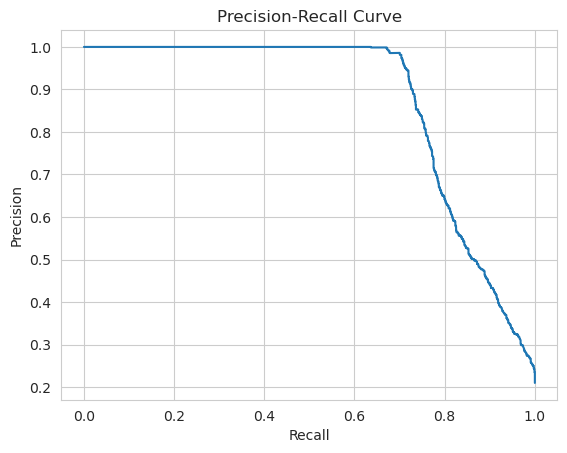

In [86]:
# Calculate precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

# Plot the precision-recall curve
plt.plot(recall, precision)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

Recall at 0.72 precision: 0.7753743760399334
Threshold probability results in 0.72 precision: 0.2107100933790207


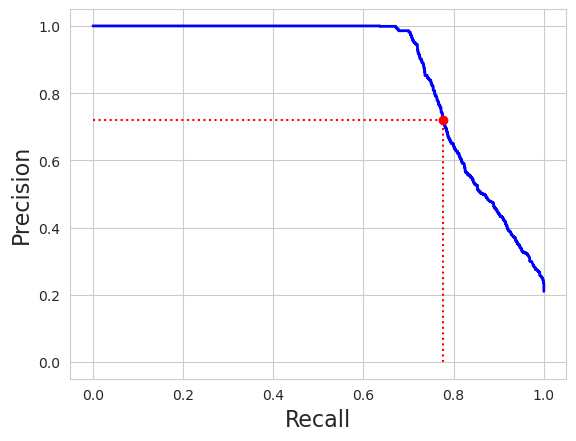

In [84]:
# Recall at 0.72 precision
recall_72_precision = recall[np.argmax(precision >= 0.72)]
threshold_72_precision = thresholds[np.argmax(precision >= 0.72)]

def plot_precision_vs_recall(precisions, recalls):
    plt.plot(recalls, precisions, "b-", linewidth=2)
    plt.xlabel("Recall", fontsize=16)
    plt.ylabel("Precision", fontsize=16)


plot_precision_vs_recall(precision, recall)
plt.plot([recall_72_precision, recall_72_precision], [0., 0.72], "r:")
plt.plot([0.0, recall_72_precision], [0.72, 0.72], "r:")
plt.plot([recall_72_precision], [0.72], "ro")

print(f'Recall at 0.72 precision: {recall_72_precision}')
print(f'Threshold probability results in 0.72 precision: {threshold_72_precision}')

In [87]:
import joblib
joblib.dump(xgb_pipeline, 'XGB_Pipeline.joblib')

['XGB_Pipeline.joblib']